In [108]:
#East West Airlines.csv

In [109]:
#!pip install yellowbrick

In [110]:
#Importing Necessary Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_theme(style='darkgrid',palette='rainbow')
from scipy.cluster import hierarchy
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [111]:
#Read The Datset
df = pd.read_csv('https://raw.githubusercontent.com/KJanhavi2424/My-Datasets/main/EastWestAirlines.csv')
df

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [112]:
sns.pairplot(df)
plt.tight_layout()
plt.show()

In [113]:
df.describe()

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0                      3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [115]:
sc = StandardScaler()
x = sc.fit_transform(df)
x

array([[-1.73512503e+00, -4.51140783e-01, -1.86298687e-01, ...,
        -3.62167870e-01,  1.39545434e+00, -7.66919299e-01],
       [-1.73426342e+00, -5.39456874e-01, -1.86298687e-01, ...,
        -3.62167870e-01,  1.37995704e+00, -7.66919299e-01],
       [-1.73340181e+00, -3.20031232e-01, -1.86298687e-01, ...,
        -3.62167870e-01,  1.41192021e+00, -7.66919299e-01],
       ...,
       [ 1.72682006e+00, -4.29480975e-05, -1.86298687e-01, ...,
        -3.62167870e-01, -1.31560393e+00,  1.30391816e+00],
       [ 1.72768167e+00, -1.85606976e-01, -1.86298687e-01, ...,
        -9.85033311e-02, -1.31608822e+00, -7.66919299e-01],
       [ 1.72854328e+00, -7.00507951e-01, -1.86298687e-01, ...,
        -3.62167870e-01, -1.31754109e+00, -7.66919299e-01]])

In [116]:
#Hierarchical Clustering

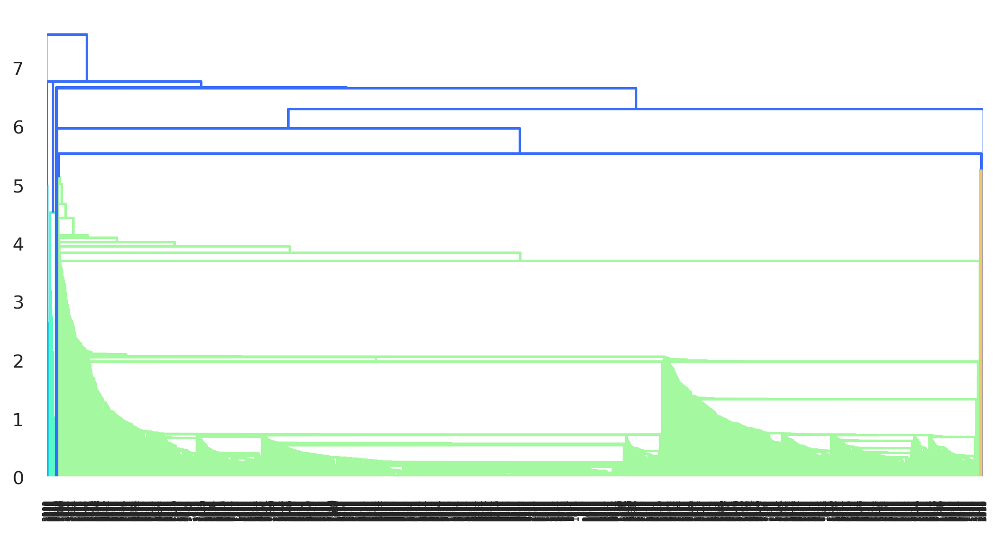

In [117]:
lk = hierarchy.linkage(x,method='single')
dendro = hierarchy.dendrogram(lk)

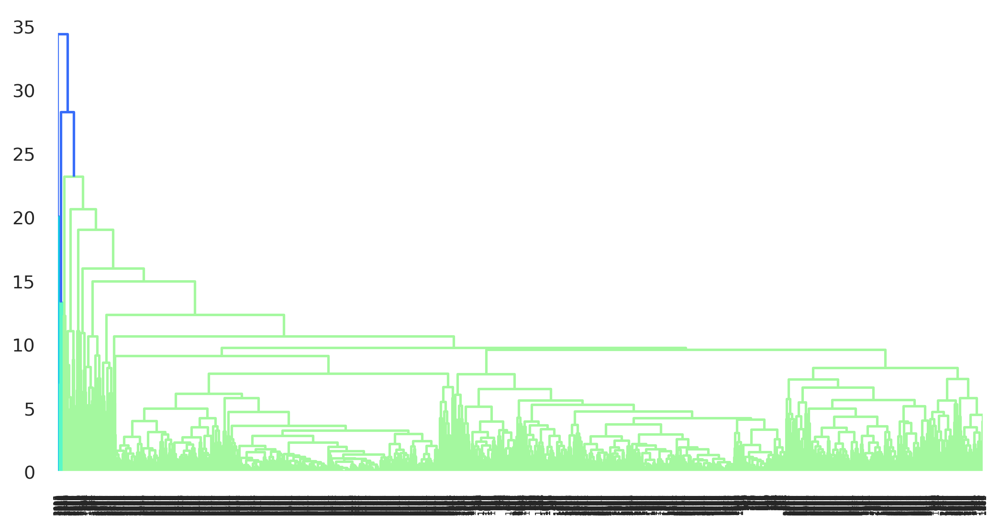

In [118]:
lk = hierarchy.linkage(x,method='complete')
dendro = hierarchy.dendrogram(lk)

In [119]:
hc = AgglomerativeClustering(n_clusters=2)
y = hc.fit_predict(x)
y

array([1, 1, 1, ..., 0, 1, 1])

In [120]:
df['y'] = y

In [121]:
df[df['y']==0]

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,y
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,0
6,7,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,8,20856,0,1,1,1,5250,4,250,1,6938,1,0
9,10,104860,0,3,1,1,28426,28,1150,3,6931,1,0
10,11,40091,0,2,1,1,7278,10,0,0,6959,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3987,4010,11933,0,1,1,1,249,3,79,1,1412,1,0
3989,4012,2622,0,1,1,1,1625,6,0,0,1404,1,0
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1,0


In [122]:
df.groupby('y').agg('mean')

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
y,,,,,,,,,,,,
0,1697.401670,103234.099258,258.968924,2.808905,1.00000,1.022727,28359.527829,15.961503,746.752783,2.183210,4696.572356,0.679035
1,2386.144872,38935.969072,9.754205,1.182854,1.03147,1.000000,4025.555073,6.501899,124.668475,0.426479,3442.381443,0.009224


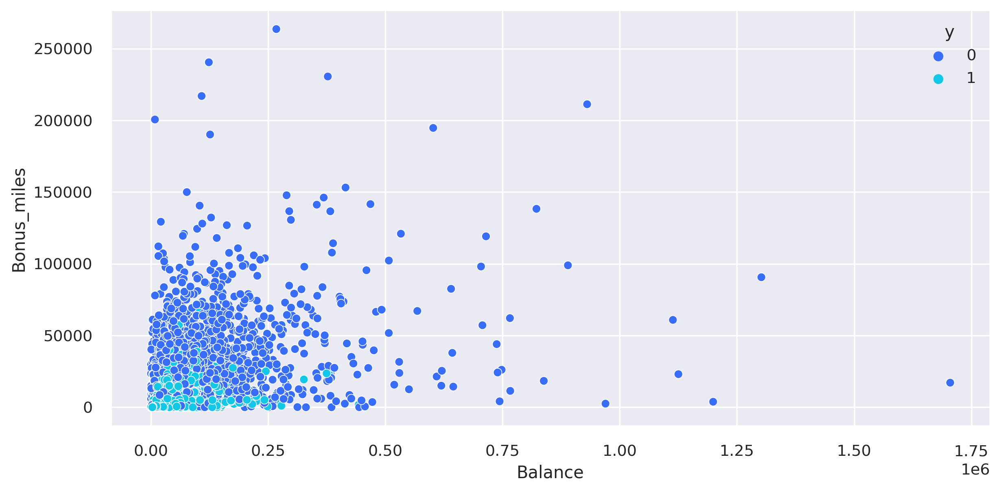

In [123]:
sns.scatterplot(x=df['Balance'],y=df['Bonus_miles'],hue = df['y'])
plt.xlabel = 'Balance'
plt.ylabel = 'Bonus'
plt.tight_layout()
plt.show()

In [124]:
df

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,y
0,1,28143,0,1,1,1,174,1,0,0,7000,0,1
1,2,19244,0,1,1,1,215,2,0,0,6968,0,1
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,1
3,4,14776,0,1,1,1,500,1,0,0,6952,0,1
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1,0
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1,0
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1,0
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0,1


In [125]:
#KMeans Clustering And Model Building

In [126]:
km = KMeans()
y = km.fit_predict(x)

In [127]:
#Cluster Centers
km.cluster_centers_

array([[ 9.71288517e-01, -3.45133595e-01, -1.42798903e-01,
        -4.95708814e-01, -9.82418871e-02, -5.85677917e-02,
        -4.73166850e-01, -4.27421265e-01, -2.13649383e-01,
        -2.38980340e-01, -9.69154802e-01, -7.66919299e-01],
       [-8.64345408e-01, -1.53011943e-01, -1.27523891e-01,
        -4.76684882e-01, -9.82418871e-02, -5.81558494e-02,
        -4.71731567e-01, -3.92436778e-01, -1.82151893e-01,
        -1.96754563e-01,  8.44363123e-01, -4.51913421e-01],
       [-2.40569242e-01,  1.08115781e+00,  4.66543156e-01,
         1.59903100e-01, -9.82418871e-02, -6.27665798e-02,
         7.39780775e-01,  1.88152929e+00,  4.14283144e+00,
         4.37038716e+00,  2.65575852e-01,  9.17829820e-01],
       [ 3.77432533e-02,  4.69182809e-01,  7.02897746e+00,
        -4.31702374e-03, -9.82418871e-02, -6.27665798e-02,
         9.98861951e-02,  9.53862249e-02,  3.70576145e-01,
         4.24117451e-01, -6.25973659e-02,  3.42457911e-01],
       [-3.01522483e-01,  6.39719256e-01, -8.4432923

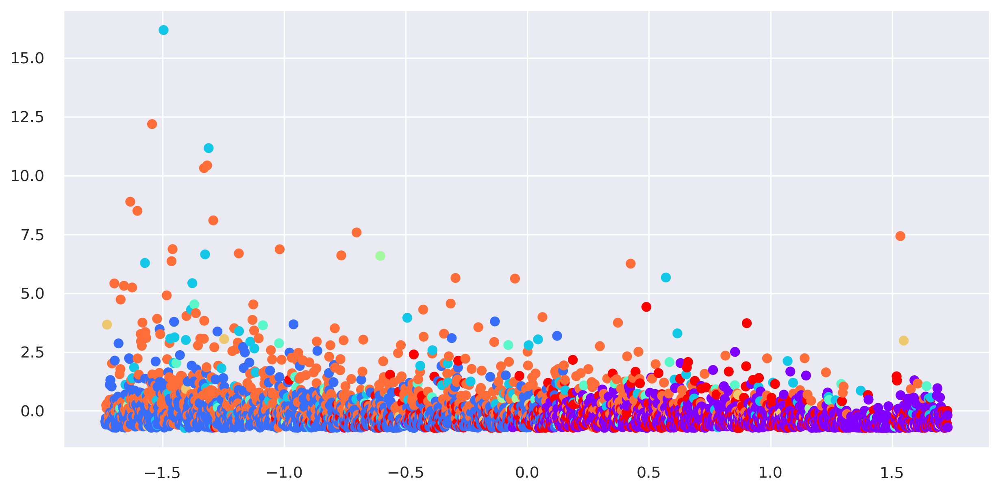

In [128]:
#Visualize the clusters
plt.scatter(x[:,0],x[:,1],c=y,cmap='rainbow')
plt.tight_layout()
plt.show()

In [129]:
#silhouette score
silhouette_score(x,y)

0.26011686461207945

In [130]:
#Elbow graph
wcss = []
for i in range(1,20):
  km = KMeans(n_clusters=i)
  km.fit_predict(x)
  wcss.append(km.inertia_)

In [131]:
wcss

[47987.999999999985,
 39018.80518728671,
 34530.84508622571,
 30616.623636092663,
 26894.771760465457,
 24762.19208130813,
 21896.498947313044,
 19354.977722064414,
 18020.54493242867,
 16849.5893083135,
 15933.86968230116,
 14963.736351360541,
 14448.431244589374,
 13637.067480073641,
 13117.267018299275,
 12698.201814626744,
 12169.955974136003,
 11755.810650358439,
 11384.734896230648]

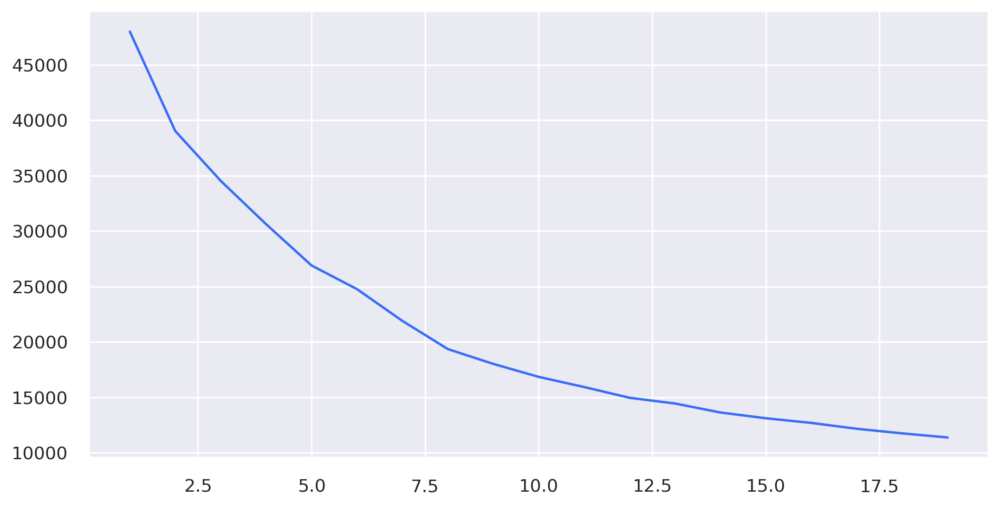

In [132]:
plt.plot(range(1,20),wcss)

In [133]:
#Final Model
km = KMeans(n_clusters=5)
ypred = km.fit_predict(x)
ypred

array([2, 2, 2, ..., 1, 1, 1], dtype=int32)

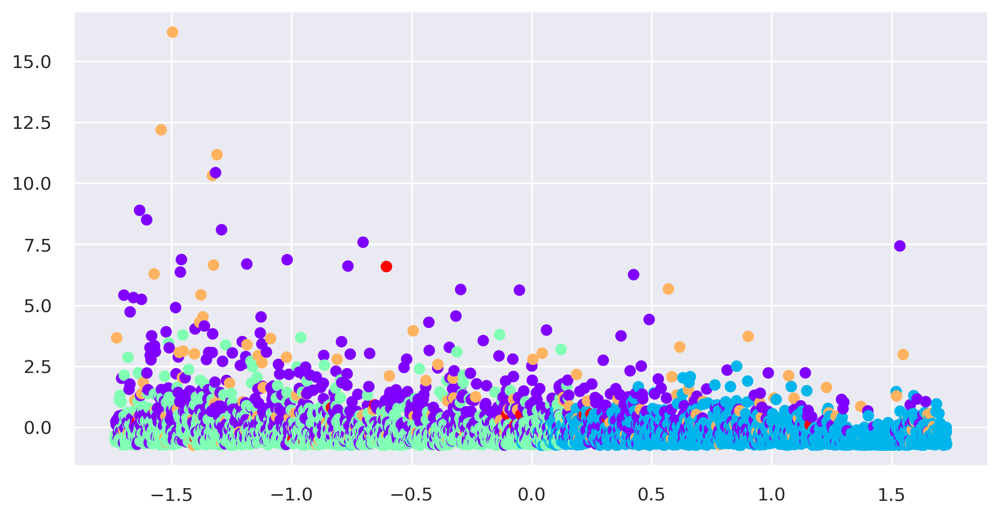

In [134]:
plt.scatter(x[:,0],x[:,1],c=ypred,cmap='rainbow')

In [135]:
km.cluster_centers_

array([[-0.39411253,  0.51489622,  0.02632923,  1.35915794, -0.08502509,
        -0.05277142,  1.12322174,  0.7991783 , -0.06463338, -0.07097933,
         0.39701031,  0.68771774],
       [ 0.96700374, -0.33846911, -0.05436178, -0.50396931,  0.01800486,
        -0.06276658, -0.45837651, -0.40678431, -0.1881385 , -0.20640565,
        -0.95581028, -0.35138492],
       [-0.79277761, -0.16477317, -0.06034752, -0.51298745,  0.02797442,
        -0.05878947, -0.46862996, -0.38099826, -0.16459217, -0.17567843,
         0.77251574, -0.25081773],
       [-0.22708278,  1.20284695,  0.8613124 ,  0.10111012,  0.16228153,
        -0.06276658,  0.63485991,  1.68030149,  3.607528  ,  3.91562026,
         0.27255539,  0.93222938],
       [-0.30152248,  0.63971926, -0.08443292,  1.0220844 , -0.09824189,
        15.64629931,  3.17969131,  1.71461374,  0.03329269,  0.05969539,
         0.23987261,  0.33752735]])

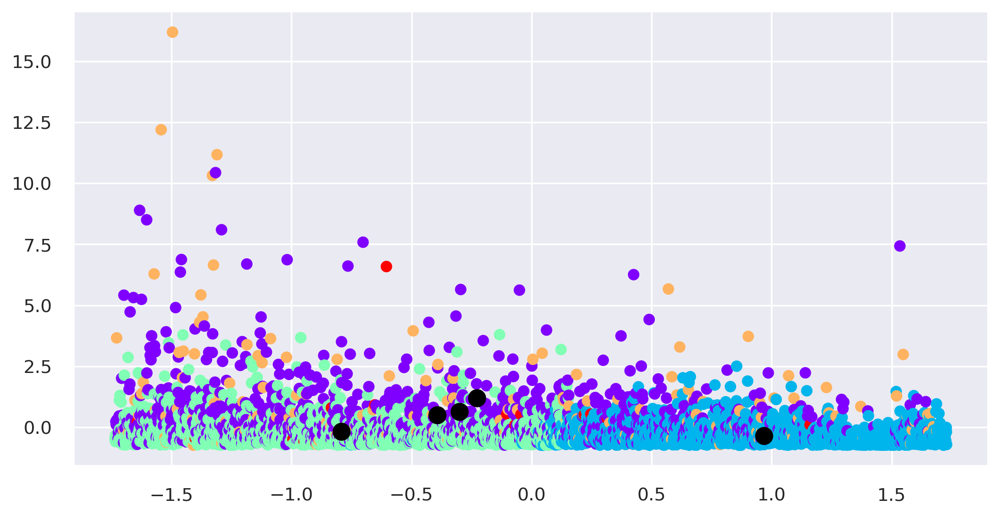

In [136]:
plt.scatter(x[:,0],x[:,1],c=ypred,cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='black',s=100)

In [137]:
silhouette_score(x,ypred)

0.23892741337042311

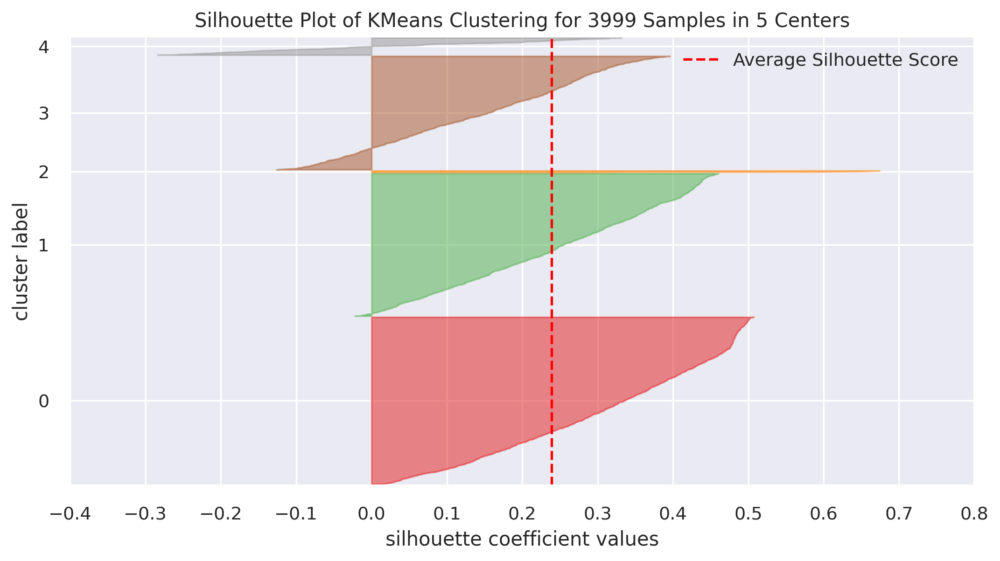

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 3999 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [138]:
model = SilhouetteVisualizer(KMeans(n_clusters=5))
vis = model.fit(x)
vis.show()

In [139]:
sil_score = []
for i in range(2,20):
  km = KMeans(n_clusters=i)
  y = km.fit_predict(x)
  sil_score.append(silhouette_score(x,y))

In [140]:
sil_score

[0.29782139660896717,
 0.2808960275828901,
 0.22845156384774262,
 0.23889492900128775,
 0.24798851356362817,
 0.25834945532381964,
 0.2529138236122234,
 0.26379930048427086,
 0.274008766691201,
 0.2697689426926605,
 0.27678263103623435,
 0.27919138294670715,
 0.24735596441487284,
 0.28648333540555326,
 0.2558308234101457,
 0.25767640636619094,
 0.2548297621791201,
 0.2614600884973686]

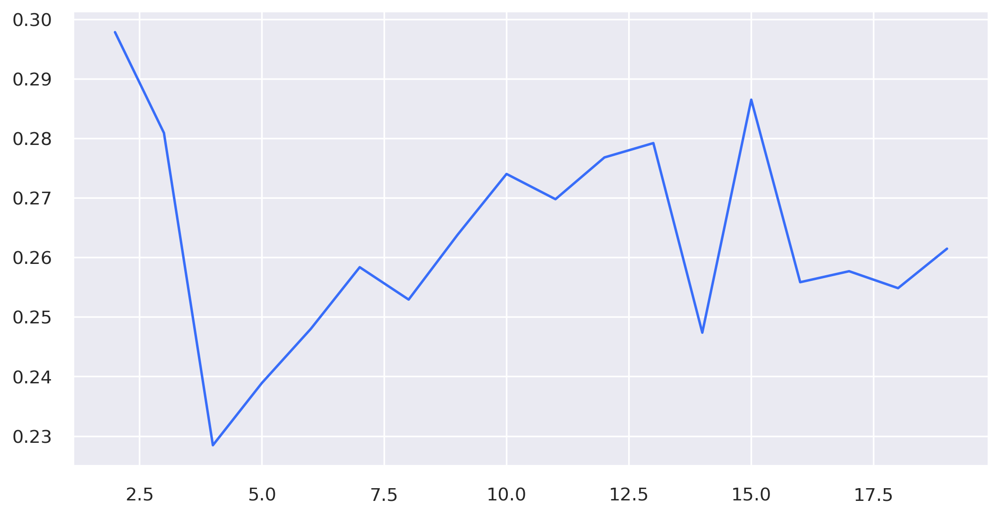

In [141]:
plt.plot(range(2,20),sil_score)

In [142]:
df['Bonus_miles'] = ypred
df

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,y
0,1,28143,0,1,1,1,2,1,0,0,7000,0,1
1,2,19244,0,1,1,1,2,2,0,0,6968,0,1
2,3,41354,0,1,1,1,2,4,0,0,7034,0,1
3,4,14776,0,1,1,1,2,1,0,0,6952,0,1
4,5,97752,0,4,1,1,0,26,2077,4,6935,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,1,4,200,1,1403,1,0
3995,4018,64385,0,1,1,1,1,5,0,0,1395,1,0
3996,4019,73597,0,3,1,1,1,8,0,0,1402,1,0
3997,4020,54899,0,1,1,1,1,1,500,1,1401,0,1


In [143]:
df.groupby('Bonus_miles').agg('mean')

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,y
Bonus_miles,,,,,,,,,,,,
0,1557.404878,125483.848780,164.481951,3.930732,1.001951,1.001951,19.276098,369.566829,1.104390,4938.336585,0.702439,0.001951
1,3137.142574,39496.143234,102.062046,1.365677,1.017162,1.000000,7.695710,196.655446,0.590759,2144.929373,0.200660,0.744554
2,1094.706522,56998.277950,97.431677,1.353261,1.018634,1.000776,7.943323,229.621118,0.707298,5713.708851,0.249224,0.550466
3,1751.262821,194803.871795,810.397436,2.198718,1.038462,1.000000,27.737179,5510.717949,16.224359,4681.352564,0.820513,0.025641
4,1664.866667,138061.400000,78.800000,3.466667,1.000000,4.066667,28.066667,506.666667,1.600000,4613.866667,0.533333,0.000000


In [144]:
#DBSCAN

In [145]:
db = DBSCAN()
y = db.fit_predict(x)

In [146]:
#Silhouette Score
silhouette_score(x,y)

-0.2823258834687895

In [147]:
#Nearest Neighbors
neigh = NearestNeighbors(n_neighbors=3).fit(x)
d,i = neigh.kneighbors(x)

In [148]:
pd.DataFrame(d)

,0,1,2
0,0.0,0.135379,0.137435
1,0.0,0.114076,0.137435
2,0.0,0.219562,0.272519
3,0.0,0.107546,0.112031
4,0.0,0.560199,0.774714
...,...,...,...
3994,0.0,0.374224,0.418542
3995,0.0,0.375466,0.444557
3996,0.0,0.195238,0.327193
3997,0.0,0.289179,0.330073


In [149]:
dist = np.sort(d[:,1],axis=0)
dist

array([2.42270462e-03, 2.42270462e-03, 4.69027727e-03, ...,
       6.66765339e+00, 6.68121018e+00, 7.58357087e+00])

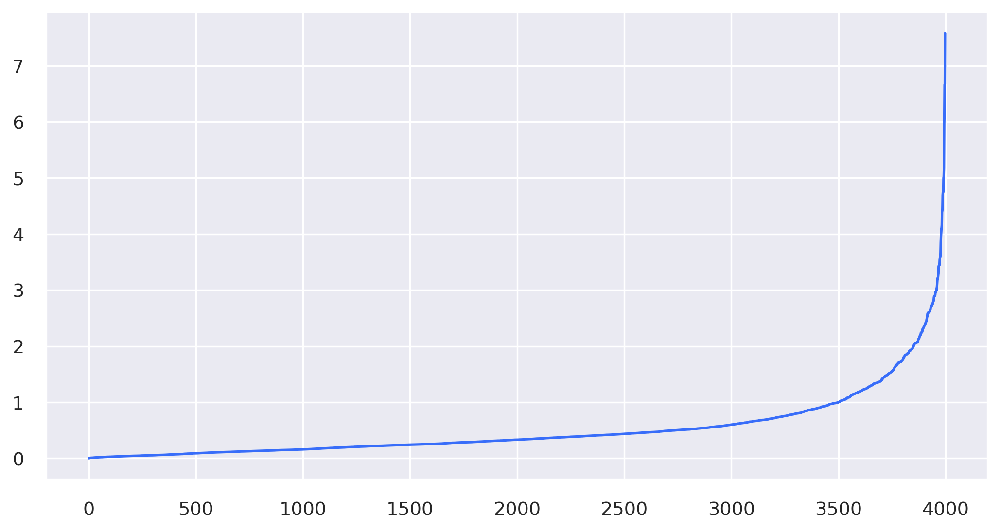

In [150]:
plt.plot(dist)

In [151]:
db = DBSCAN(eps=2,min_samples=3)
ypred = db.fit_predict(x)
ypred

array([0, 0, 0, ..., 1, 0, 0])

In [152]:
silhouette_score(x,ypred)

0.20982236466880683

In [153]:
df['Balance'] = ypred

In [154]:
df[df['Balance']==-1]

,,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,y
8,9,-1,0,3,2,1,3,43,3850,12,6948,1,1
50,51,-1,0,1,1,1,2,5,6368,5,6844,0,0
65,66,-1,0,3,1,1,3,45,5550,29,6826,1,0
70,72,-1,5031,2,1,1,2,16,1150,4,7766,0,0
87,90,-1,0,3,1,1,0,22,1200,8,6820,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3897,3920,-1,2954,3,1,1,0,20,2500,5,1569,1,0
3902,3925,-1,1000,1,1,1,1,39,0,0,1572,1,0
3911,3934,-1,2273,1,1,1,3,19,4104,16,1552,0,0
3917,3940,-1,0,4,1,1,3,37,6349,7,1545,0,0


In [155]:
sns.pairplot(df,hue='Balance',palette='viridis')